<h1>Project Title:Legal Topic Extraction from Indian Judgments using Topic Modeling
Techniques</h1>
<h3> Author: Diluxana Uthayakumar </h3>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##**Importing Libraries**

In [4]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [5]:
import sys
# !{sys.executable} -m spacy download en
import re, numpy as np, pandas as pd
from pprint import pprint

# Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
#from gensim.utils import lemmatize, simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

In [6]:
import gensim
print(gensim.__version__)

4.3.2


In [7]:
import numpy as np
import pandas as pd
import os
import string
import re

import matplotlib.pyplot as plt

%matplotlib inline

import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
#from spacy.lemmatizer import Lemmatizer
from spacy.lookups import Lookups

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

from wordcloud import WordCloud
stop_words = stopwords.words('english')

from gensim.models.ldamodel import LdaModel

In [8]:
import matplotlib.colors as mcolors
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes

##**Loading Dataset**

In [9]:
dataset=pd.read_csv("/content/drive/MyDrive/legal_txt.csv") #Dataset Downloaded from https://huggingface.co/datasets/ninadn/indian-legal/blob/main/train.csv
print("Dataset has {} rows and {} columns".format(dataset.shape[0], dataset.shape[1]))

Dataset has 7030 rows and 2 columns


In [10]:
dataset.head()

,Text,Summary
0,Appeal No. LXVI of 1949.\nAppeal from the High...,The charge created in respect of municipal pro...
1,Civil Appeal No.94 of 1949.\n107 834 Appeal fr...,"An agreement for a lease, which a lease is by ..."
2,"iminal Appeal No. 40 of 1951, 127 Appeal from ...","The question whether a Magistrate is ""personal..."
3,Appeal No. 388 of 1960.\nAppeal by special lea...,The appellant was a member of a joint Hindu fa...
4,Appeal No. 198 of 1954.\nAppeal from the judgm...,The appellant was the Ruler of the State of Ba...


In [11]:
text= dataset[['Text']]

In [12]:
text.head()

,Text
0,Appeal No. LXVI of 1949.\nAppeal from the High...
1,Civil Appeal No.94 of 1949.\n107 834 Appeal fr...
2,"iminal Appeal No. 40 of 1951, 127 Appeal from ..."
3,Appeal No. 388 of 1960.\nAppeal by special lea...
4,Appeal No. 198 of 1954.\nAppeal from the judgm...


##**Text Preprocessing**

In [13]:

def clean_text(text):
    le=WordNetLemmatizer()
    word_tokens=word_tokenize(text.lower())
    tokens=[le.lemmatize(w) for w in word_tokens if w not in stop_words and len(w)>3]
    cleaned_text=" ".join(tokens)
    return cleaned_text


In [14]:
import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping grammars/basque_grammars.zip.
[nltk_data]    | Downloading package bcp47 to /root/nltk_data...
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   U

True

In [15]:
text['cleaned_text']=text['Text'].apply(clean_text)

In [16]:
text.head()

,Text,cleaned_text
0,Appeal No. LXVI of 1949.\nAppeal from the High...,appeal lxvi 1949. appeal high court judicature...
1,Civil Appeal No.94 of 1949.\n107 834 Appeal fr...,civil appeal no.94 1949 appeal judgment decree...
2,"iminal Appeal No. 40 of 1951, 127 Appeal from ...",iminal appeal 1951 appeal judgment order dated...
3,Appeal No. 388 of 1960.\nAppeal by special lea...,appeal 1960. appeal special leave judgment ord...
4,Appeal No. 198 of 1954.\nAppeal from the judgm...,appeal 1954. appeal judgment order dated octob...


## **Document-Term matrix**

In [17]:
vect =TfidfVectorizer(stop_words=stop_words,max_features=500)
vect_text=vect.fit_transform(text['cleaned_text'])
print(vect.get_feature_names_out())

['000' '1948' '1950' '1955' '1956' 'accepted' 'accordance' 'according'
 'accordingly' 'account' 'accused' 'acquisition' 'act' 'action'
 'additional' 'affidavit' 'aforesaid' 'agent' 'agreement' 'alleged'
 'allowed' 'already' 'also' 'amendment' 'amount' 'another' 'appeal'
 'appear' 'appears' 'appellant' 'appellate' 'applicable' 'application'
 'applied' 'apply' 'appointed' 'appointment' 'appropriate' 'april' 'area'
 'argument' 'article' 'aside' 'assessee' 'assessment' 'assistant' 'august'
 'authority' 'available' 'award' 'bank' 'based' 'basis' 'become' 'behalf'
 'bench' 'benefit' 'board' 'body' 'bombay' 'brought' 'building' 'business'
 'called' 'came' 'candidate' 'capital' 'case' 'category' 'cause' 'central'
 'certain' 'certificate' 'charge' 'chief' 'circumstance' 'civil' 'claim'
 'claimed' 'class' 'clause' 'clear' 'clearly' 'code' 'collector' 'come'
 'commission' 'commissioner' 'committed' 'committee' 'common' 'company'
 'compensation' 'concerned' 'conclusion' 'condition' 'conferred'
 'c

In [18]:
vect_text.shape

(7030, 500)

In [19]:
idf=vect.idf_

In [20]:
dd=dict(zip(vect.get_feature_names_out(), idf))
l=sorted(dd, key=(dd).get)
print(l)
print(l[0],l[-1])

['court', 'judgment', 'case', 'order', 'respondent', 'dated', 'delivered', 'made', 'also', 'appeal', 'section', 'therefore', 'high', 'would', 'question', 'appellant', 'view', 'fact', 'whether', 'said', 'held', 'could', 'time', 'matter', 'shall', 'must', 'state', 'taken', 'even', 'cost', 'first', 'provision', 'person', 'dismissed', 'decision', 'given', 'special', 'within', 'make', 'purpose', 'ground', 'necessary', 'upon', 'reason', 'part', 'filed', 'however', 'present', 'learned', 'respect', 'right', 'circumstance', 'without', 'opinion', 'allowed', 'referred', 'leave', 'contention', 'behalf', 'result', 'effect', 'year', 'stated', 'regard', 'counsel', 'application', 'take', 'certain', 'though', 'consideration', 'party', 'relevant', 'authority', 'well', 'rule', 'clear', 'date', 'provided', 'concerned', 'thus', 'following', 'point', 'term', 'entitled', 'government', 'according', 'read', 'subject', 'petition', 'word', 'passed', 'civil', 'found', 'judge', 'mentioned', 'either', 'general', 'a

In [21]:
print(dd['like'])
print(dd['court'])

1.8890724410926836
1.0004267728921736


##**LSA**

In [22]:
#TOPIC MODELLING
lsa_model = TruncatedSVD(n_components=6, algorithm='randomized', n_iter=10, random_state=42)

lsa_top=lsa_model.fit_transform(vect_text)

In [23]:
lsa_model.explained_variance_ratio_

array([0.01026148, 0.04159783, 0.03882627, 0.03532608, 0.02672107,
       0.02252066])

In [24]:
lsa_model.singular_values_

array([35.50682736, 15.59100793, 15.05167996, 14.34721192, 12.48251275,
       11.45586631])

In [25]:
lsa_top.shape

(7030, 6)

In [26]:
#Topics for document 0:
for i, topic in enumerate(lsa_top[0]):
    print("Topic ", i, " : ", topic*100)

Topic  0  :  41.582733196152496
Topic  1  :  36.134809948500624
Topic  2  :  13.109286781221213
Topic  3  :  11.001159494804734
Topic  4  :  10.3167330476962
Topic  5  :  -3.60271552387536


In [27]:
print(lsa_model.components_.shape)
print(lsa_model.components_)

(6, 500)
[[ 0.02955215  0.0187199   0.02305377 ...  0.09566687  0.04838374
   0.07238731]
 [ 0.03358311  0.02128546  0.01732179 ... -0.00651291 -0.01829425
   0.10731079]
 [ 0.01660991  0.00448656 -0.00026256 ... -0.01018628 -0.07328515
  -0.0504586 ]
 [ 0.01289792 -0.00604504 -0.00398273 ... -0.00763276 -0.05485296
   0.05185626]
 [-0.0332355   0.01195774  0.00913874 ... -0.01906649 -0.00395462
  -0.02537023]
 [-0.01586048 -0.0023576  -0.00678699 ...  0.00636791 -0.01137399
   0.03378779]]


In [28]:
vocab = vect.get_feature_names_out()
topic_content = []
for v in lsa_model.components_:
    sorted_vocab = sorted(zip(vocab, v), key=lambda x : x[1], reverse=True)
    topic_content.append({x:y for x, y in sorted_vocab})


In [29]:
print("Top 5 words in topic 1 : ", list(topic_content[0].keys())[:5])
print("Top 5 words in topic 2 : ", list(topic_content[1].keys())[:5])
print("Top 5 words in topic 3 : ", list(topic_content[2].keys())[:5])
print("Top 5 words in topic 4 : ", list(topic_content[3].keys())[:5])
print("Top 5 words in topic 5 : ", list(topic_content[4].keys())[:5])
print("Top 5 words in topic 6 : ", list(topic_content[5].keys())[:5])

Top 5 words in topic 1 :  ['court', 'section', 'appellant', 'case', 'order']
Top 5 words in topic 2 :  ['income', 'assessee', 'company', 'assessment', 'profit']
Top 5 words in topic 3 :  ['land', 'suit', 'tenant', 'property', 'plaintiff']
Top 5 words in topic 4 :  ['income', 'accused', 'assessee', 'offence', 'evidence']
Top 5 words in topic 5 :  ['section', 'land', 'offence', 'state', 'notification']
Top 5 words in topic 6 :  ['tenant', 'workman', 'rent', 'landlord', 'tribunal']


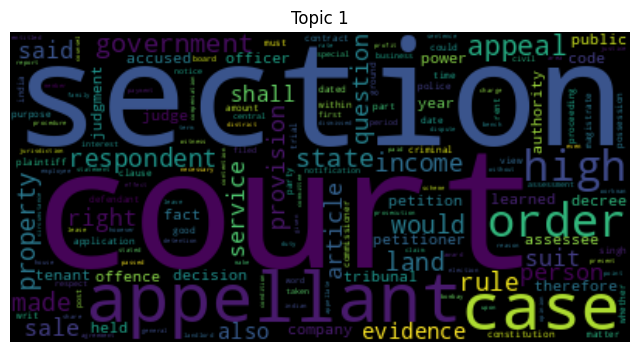

In [30]:
wc1= WordCloud(background_color="black", max_words=500)
wc1.generate_from_frequencies(topic_content[0])

fig = plt.figure(1, figsize=(8, 8))
plt.imshow(wc1, interpolation="bilinear")
plt.title("Topic 1")
plt.axis("off")
plt.show()

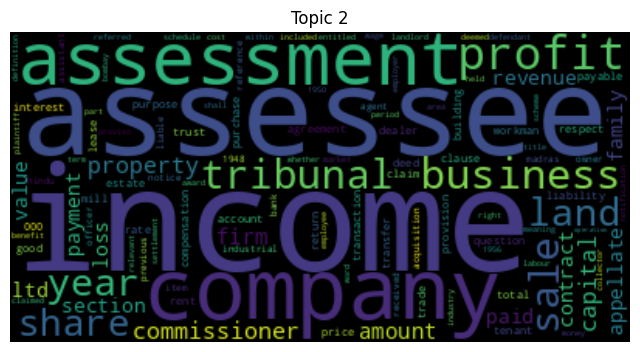

In [31]:
wc2= WordCloud(background_color="black", max_words=500)
wc2.generate_from_frequencies(topic_content[1])

fig = plt.figure(1, figsize=(8,8))
plt.imshow(wc2, interpolation="bilinear")
plt.title("Topic 2")
plt.axis("off")
plt.show()

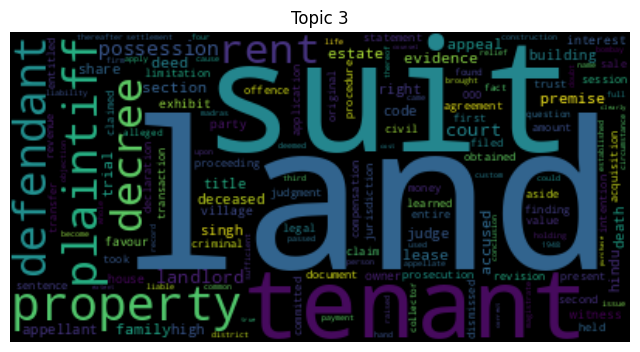

In [32]:
wc3= WordCloud(background_color="black", max_words=500)
wc3.generate_from_frequencies(topic_content[2])

fig = plt.figure(1, figsize=(8,8))
plt.imshow(wc3, interpolation="bilinear")
plt.title("Topic 3")
plt.axis("off")
plt.show()

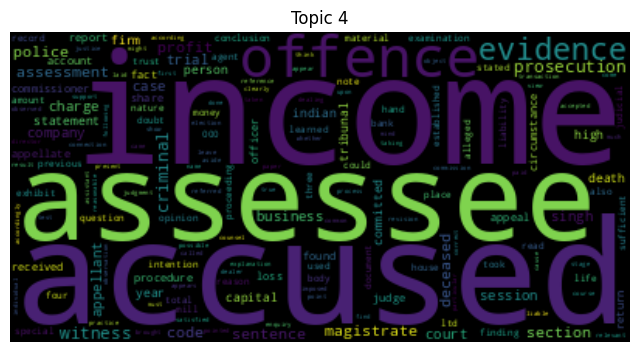

In [33]:
wc4= WordCloud(background_color="black", max_words=500)
wc4.generate_from_frequencies(topic_content[3])

fig = plt.figure(1, figsize=(8, 8))
plt.imshow(wc4, interpolation="bilinear")
plt.title("Topic 4")
plt.axis("off")
plt.show()

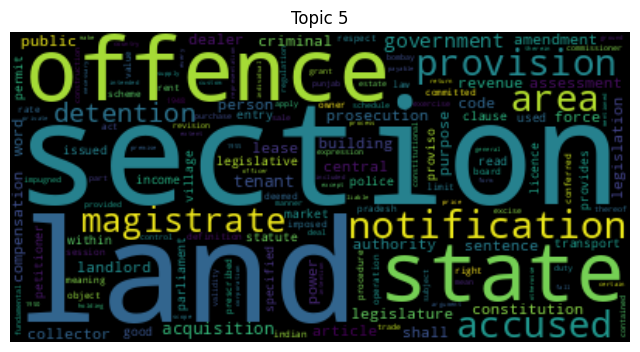

In [34]:
wc5= WordCloud(background_color="black", max_words=500)
wc5.generate_from_frequencies(topic_content[4])

fig = plt.figure(1, figsize=(8, 8))
plt.imshow(wc5, interpolation="bilinear")
plt.title("Topic 5")
plt.axis("off")
plt.show()

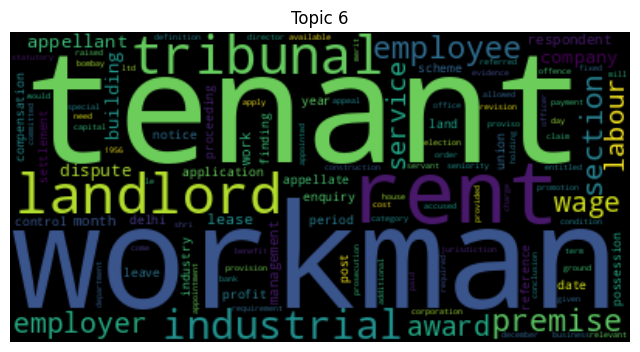

In [35]:
wc6= WordCloud(background_color="black", max_words=500)
wc6.generate_from_frequencies(topic_content[5])

fig = plt.figure(1, figsize=(8, 8))
plt.imshow(wc6, interpolation="bilinear")
plt.title("Topic 6")
plt.axis("off")
plt.show()

T-SNE Clustering

In [36]:
from sklearn.manifold import TSNE

In [37]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100,
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_top)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 7030 samples in 0.011s...
[t-SNE] Computed neighbors for 7030 samples in 0.708s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7030
[t-SNE] Computed conditional probabilities for sample 2000 / 7030
[t-SNE] Computed conditional probabilities for sample 3000 / 7030
[t-SNE] Computed conditional probabilities for sample 4000 / 7030
[t-SNE] Computed conditional probabilities for sample 5000 / 7030
[t-SNE] Computed conditional probabilities for sample 6000 / 7030
[t-SNE] Computed conditional probabilities for sample 7000 / 7030
[t-SNE] Computed conditional probabilities for sample 7030 / 7030
[t-SNE] Mean sigma: 0.062664
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.077011
[t-SNE] KL divergence after 2000 iterations: 1.358997


In [38]:
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])

In [39]:
from collections import Counter
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [40]:
lsa_keys = get_keys(lsa_top)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [41]:
#!pip install --upgrade bokeh==2.4.3

In [42]:
lsa_keys = get_keys(lsa_top)
n_topics=6
plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), width=500, height=500)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=mycolors[lsa_keys])

show(plot)

##**LDA**

In [43]:
from gensim import corpora, models
import gensim

In [44]:
splitText = text['cleaned_text'].apply(lambda x:word_tokenize(x))

In [45]:
#Creating Dictionary and Corpus- Term Document Frequency
dictionary = corpora.Dictionary(splitText)
corpus = [dictionary.doc2bow(t) for t in splitText]

In [46]:
corpus

[[(0, 1),
  (1, 6),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 2),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 2),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 3),
  (25, 1),
  (26, 3),
  (27, 2),
  (28, 1),
  (29, 2),
  (30, 2),
  (31, 2),
  (32, 1),
  (33, 2),
  (34, 3),
  (35, 4),
  (36, 3),
  (37, 7),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 5),
  (42, 2),
  (43, 3),
  (44, 2),
  (45, 13),
  (46, 31),
  (47, 2),
  (48, 1),
  (49, 2),
  (50, 1),
  (51, 1),
  (52, 12),
  (53, 1),
  (54, 3),
  (55, 2),
  (56, 1),
  (57, 2),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 3),
  (69, 6),
  (70, 8),
  (71, 8),
  (72, 1),
  (73, 1),
  (74, 4),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 2),
  (80, 1),
  (81, 1),
  (82, 2),
  (83, 2),
  (84, 1),
  (85, 2),
  (86, 17),
  (87, 1),
  (88, 3),
  (89, 2),
  (90, 1),
  (91

In [ ]:
ldamodel = models.ldamodel.LdaModel(corpus, id2word=dictionary,
                                    num_topics=6, passes=5, minimum_probability=0)

In [ ]:
from gensim.models import CoherenceModel
coherence_model_lda=CoherenceModel(model=ldamodel, texts=splitText, dictionary=dictionary, coherence='c_v')
coherence_lda=coherence_model_lda.get_coherence()

print('\nCoherence Score: ', coherence_lda)

In [ ]:
ldamodel.print_topics()

**Displaying Topics in top 20 documents**

In [ ]:
def get_lda_topics(model, num_topics):
    word_dict = {};
    for i in range(num_topics):
        words = model.show_topic(i, topn = 20);
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = [i[0] for i in words];
    return pd.DataFrame(word_dict);

get_lda_topics(ldamodel, 6)

**Dominant** **Topic and its Percentage Contribution in each document**

In [ ]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=text['cleaned_text']):
    sent_topics_df2 = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list
        row = sorted(row, key=lambda x: (x[1]), reverse=True)

        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df2 = sent_topics_df2.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df2.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(text['Text'])
    sent_topics_df1 = pd.concat([sent_topics_df2, contents], axis=1)
    return(sent_topics_df2)

In [ ]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=ldamodel, corpus=corpus, texts=text['Text'])

In [ ]:
df_topic_sents_keywords

In [ ]:
contents = pd.Series(text['Text'])
df_topic_sents_keywords = pd.concat([df_topic_sents_keywords, contents], axis=1)

In [ ]:
df_topic_sents_keywords

In [ ]:
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

**Displaying most representative sentence for each topic**

In [ ]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet,
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)],
                                            axis=0)

# Reset Index
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)

In [ ]:

from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = ldamodel.show_topics(formatted=False)

fig, axes = plt.subplots(2, 3, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=20))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

Refactoring results of LDA into numpy matrix

In [ ]:
hm = np.array([[y for (x,y) in ldamodel[corpus[i]]] for i in range(len(corpus))])


And reduce dimensionality using t-SNE algorithm:

In [ ]:

tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(hm)

topic_num = np.argmax(hm, axis=1)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 6
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics),
              plot_width=500, plot_height=500)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

##**NMF**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer;
from sklearn.decomposition import NMF;
from sklearn.preprocessing import normalize;

In [ ]:
transformer = TfidfTransformer(smooth_idf=False);
x_tfidf = transformer.fit_transform(vect_text);

In [ ]:
xtfidf_norm = normalize(x_tfidf, norm='l1', axis=1)

In [ ]:
#obtain a NMF model.
model = NMF(n_components=6, init='nndsvd');

In [ ]:
#fit the model
model.fit(xtfidf_norm)

In [ ]:
def get_nmf_topics(model, n_top_words):

    #the word ids obtained need to be reverse-mapped to the words so we can print the topic names.
    feat_names = vect.get_feature_names_out()

    word_dict = {};
    for i in range(6):

        #for each topic, obtain the largest values, and add the words they map to into the dictionary.
        words_ids = model.components_[i].argsort()[:-10 - 1:-1]
        words = [feat_names[key] for key in words_ids]
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = words;

    return pd.DataFrame(word_dict);

In [ ]:
get_nmf_topics(model, 10)